In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#well load general packages here, 
#API specific functions will be loaded right before they are used, so you can see where they come from

import torch
import numpy as np
from PIL import Image
from collections import OrderedDict
import numpy as np
from torch import nn
import os

In [3]:
device = 'cuda:0'

from torchvision.models import resnet18, alexnet

#model = resnet18(pretrained=True)
#model = alexnet(pretrained=True)
#_ = model.to(device).eval()


In [4]:
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from circuit_pruner.utils import load_config
from circuit_pruner.data_loading import rank_image_data


normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])

unnormalize = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],
                                                     std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ],
                                                     std = [ 1., 1., 1. ]),
                               ])


preprocess =  transforms.Compose([
                                transforms.Resize((224,224)),
                                transforms.ToTensor(),
                                normalize])

kwargs = {'num_workers': 4, 'pin_memory': True, 'sampler':None} if 'cuda' in device else {}



config_file = './configs/alexnet_sparse_config.py'

config = load_config(config_file)

# dataloader = DataLoader(rank_image_data(config.data_path,
#                                         config.preprocess,
#                                         label_file_path = config.label_file_path,class_folders=True),
#                                         batch_size=64,
#                                         shuffle=False,
#                                         **kwargs)

data_folder = '/mnt/data/datasets/imagenet/train10/'

batch_dataloader = DataLoader(rank_image_data(data_folder,
                                        config.preprocess,
                                        class_folders=False),
                                        batch_size=64,
                                        shuffle=False,
                                        **kwargs)

model = config.model
_ = model.to(device).eval()


/home/chris/miniconda3/envs/circuit_pruner/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [5]:
#get all possible layer names as dictionary keys, the value of which is the corresponding layer
layers = OrderedDict([*model.named_modules()])

layers.keys()

odict_keys(['', 'features', 'features.0', 'features.1', 'features.2', 'features.3', 'features.4', 'features.5', 'features.6', 'features.7', 'features.8', 'features.9', 'features.10', 'features.11', 'features.12', 'avgpool', 'classifier', 'classifier.0', 'classifier.1', 'classifier.2', 'classifier.3', 'classifier.4', 'classifier.5', 'classifier.6'])

In [6]:
score_layer_name = 'features.10'
#score_layer_name = 'features.6'
viz_layer_name = score_layer_name.replace('.','_')
unit = 9

100%|██████████| 200/200 [00:02<00:00, 74.92it/s]



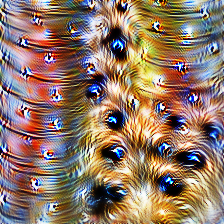

final loss: -43.323


In [8]:
from lucent_video.optvis import render, param, transform, objectives
from lucent.modelzoo import inceptionv1
import torch



device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#model = inceptionv1(pretrained=True)
_ = model.to(device).eval()


#obj = objectives.neuron(viz_layer_name,unit,batch=0)-objectives.neuron(viz_layer_name,unit,batch=1)
obj = objectives.channel(viz_layer_name,unit)  
param_f = lambda: param.image(224,magic=4)
#obj = objectives.channel('mixed4a',475)
_ = render.render_vis(model, obj, param_f, show_inline=True, thresholds = (200,),device = device)

### activation-wise scoring

In [7]:

from circuit_pruner.simple_api.target import sum_abs_loss, positional_loss
from circuit_pruner.simple_api.target import feature_target_saver

def snip_score_activation(model,image,target_layer_name,unit,position,layer_types_2_score = [nn.Conv2d,nn.Linear]):

    _ = model.eval()
    device = next(model.parameters()).device  
    layers = OrderedDict([*model.named_modules()])

    inputs = image
    #target_saver = feature_target_saver(model,layer_name,unit)
    scores = OrderedDict()
    with feature_target_saver(model,target_layer_name,unit) as target_saver:

        inputs = inputs.to(device)
        #label = label.to(device)

        model.zero_grad() #very import!
        target_activations = target_saver(inputs)

        #feature collapse
        position = (0,position[0],position[1])
        loss = positional_loss(target_activations,position)
        loss.backward()

        #get weight-wise scores
        for layer_name,layer in layers.items():
            if type(layer) not in layer_types_2_score:
                continue

            if layer.weight.grad is None:
                continue

            try: #does the model have a weight mask?
                #scale scores by batch size (*inputs.shape)
                layer_scores = torch.abs(layer.weight_mask.grad).detach().cpu()*inputs.shape[0]

            except:
                layer_scores = torch.abs(layer.weight*layer.weight.grad).detach().cpu()*inputs.shape[0]


            if layer_name not in scores.keys():
                scores[layer_name] = layer_scores
            else:
                scores[layer_name] += layer_scores

    # # eliminate layers with stored but all zero scores
    remove_keys = []
    for layer in scores:
        if torch.sum(scores[layer]) == 0.:
            remove_keys.append(layer)
    if len(remove_keys) > 0: 
        print('removing layers from scores with scores all 0:')
        for k in remove_keys:
            print(k)
            del scores[k]

    #target_saver.hook.remove() # this is important or we will accumulate hooks in our model
    model.zero_grad() 

    return scores

#### filter scoring

In [8]:
from circuit_pruner.simple_api.score import actgrad_filter_extractor

def actgrad_filter_score(model,dataloader,target_layer_name,unit,loss_f=sum_abs_loss,absolute=True,return_target=False,relu=True,score_type = 'actgrad'):
    all_layers = OrderedDict([*model.named_modules()])
    scoring_layers = []
    for layer in all_layers:
        if layer == target_layer_name:   #HACK MIGHT NOT WORK WITH INCEPTION
            break
        if isinstance(all_layers[layer],torch.nn.modules.conv.Conv2d):
            scoring_layers.append(layer)
            
    _ = model.eval()
    device = next(model.parameters()).device 
    
    scores = OrderedDict()
    
    
    overall_loss = 0
    with feature_target_saver(model,target_layer_name,unit) as target_saver:
        with actgrad_filter_extractor(model,scoring_layers,absolute = absolute) as score_saver:
            for i, data in enumerate(dataloader, 0):
                inputs, label = data
                inputs = inputs.to(device)

                model.zero_grad() #very import!
                target_activations = target_saver(inputs)

                #feature collapse
                loss = loss_f(target_activations)
                overall_loss+=loss
                loss.backward()

            #get average by dividing result by length of dset
            activations = score_saver.activations
            gradients = score_saver.gradients

            for l in scoring_layers:
                
                if score_type == 'gradients':
                    layer_scores = gradients[l]
                elif score_type == 'activations':
                    #get mask where gradient zero (outside receptive field)
                    grad_mask = (gradients[l] != 0.).float()
                    if relu:
                        rl=nn.ReLU()
                        layer_scores = (rl(activations[l]) * grad_mask).mean(dim=(1,2))
                    else:
                        layer_scores = (activations[l] * grad_mask).mean(dim=(1,2))
                    
                    
                else:   
                    if relu:
                        rl=nn.ReLU()
                        layer_scores = (rl(activations[l]) * gradients[l]).mean(dim=(1,2))
                    else:
                        layer_scores = (activations[l] * gradients[l]).mean(dim=(1,2))
                    
                    
                if l not in scores.keys():
                    scores[l] = layer_scores
                else:
                    scores[l] += layer_scores


    remove_keys = []
    for layer in scores:
        if torch.sum(scores[layer]) == 0.:
            remove_keys.append(layer)
    if len(remove_keys) > 0: 
        print('removing layers from scores with scores all 0:')
        for k in remove_keys:
            print(k)
            del scores[k]


    model.zero_grad() 
    if return_target:
        return scores,float(overall_loss.detach().cpu())
    else:
        return scores

#### center positions

In [9]:
from circuit_pruner.receptive_fields import *

input_size = (3,224,224)
rf_dict = receptive_field(model.features, input_size)

layerwise_center_positions = {'features.0':(rf_dict['1']['output_shape'][2]//2,rf_dict['1']['output_shape'][3]//2),
                              'features.3':(rf_dict['4']['output_shape'][2]//2,rf_dict['4']['output_shape'][3]//2),
                              'features.6':(rf_dict['7']['output_shape'][2]//2,rf_dict['7']['output_shape'][3]//2),
                              'features.8':(rf_dict['9']['output_shape'][2]//2,rf_dict['9']['output_shape'][3]//2),
                              'features.10':(rf_dict['11']['output_shape'][2]//2,rf_dict['11']['output_shape'][3]//2),        
                             }


------------------------------------------------------------------------------
        Layer (type)    map size      start       jump receptive_field 
        0             [224, 224]        0.5        1.0             1.0 
        1               [55, 55]        3.5        4.0            11.0 
        2               [55, 55]        3.5        4.0            11.0 
        3               [27, 27]        7.5        8.0            19.0 
        4               [27, 27]        7.5        8.0            51.0 
        5               [27, 27]        7.5        8.0            51.0 
        6               [13, 13]       15.5       16.0            67.0 
        7               [13, 13]       15.5       16.0            99.0 
        8               [13, 13]       15.5       16.0            99.0 
        9               [13, 13]       15.5       16.0           131.0 
        10              [13, 13]       15.5       16.0           131.0 
        11              [13, 13]       15.5       16.0   

In [10]:
layerwise_center_positions

{'features.0': (27, 27),
 'features.3': (13, 13),
 'features.6': (6, 6),
 'features.8': (6, 6),
 'features.10': (6, 6)}

### get all activations

In [11]:
#get activations

from circuit_pruner.simple_api.target import layer_saver

layer_activations = []

for i, data in enumerate(batch_dataloader):
    images = data[0].to(device)
    with layer_saver(model, score_layer_name) as extractor:
        batch_layer_activations = extractor(images) #all features for layer and all images in batch
        layer_activations.append(batch_layer_activations[score_layer_name])
        
        
layer_activations = torch.cat(layer_activations)
unit_activations = layer_activations[:,unit,:,:]

In [12]:
#lets get a minimum, maximum and center activation from each image

images = os.listdir(data_folder)
images.sort()

data = []

boundary_space = 3 #only consider activations 5 positions from the edge of the activation map

bounded_activations = unit_activations[:,boundary_space:-boundary_space,boundary_space:-boundary_space]
#print(bounded_activations.shape)

#ew
for i in range(bounded_activations.shape[0]):
    #max activation
#     max_act = torch.max(bounded_activations[i])
#     max_indices = (bounded_activations[i] == max_act).nonzero(as_tuple=True)
#     real_max_ind = (int(max_indices[0])+boundary_space,int(max_indices[1])+boundary_space)
#     data.append({'image':images[i],
#                      'activation':max_act,
#                      'layer':score_layer_name,
#                      'unit':unit,
#                      'position':real_max_ind})
    
#     #min activation
#     min_act = torch.min(bounded_activations[i])
#     min_indices = (bounded_activations[i] == min_act).nonzero(as_tuple=True)
#     real_min_ind = (int(min_indices[0])+boundary_space,int(min_indices[1])+boundary_space)
#     data.append({'image':images[i],
#                      'activation':min_act,
#                      'layer':score_layer_name,
#                      'unit':unit,
#                      'position':real_min_ind})
    
    #center activation

    #if not (layerwise_center_positions[score_layer_name] in (real_min_ind,real_max_ind)):
    center_pos = layerwise_center_positions[score_layer_name]
    data.append({'image':images[i],
                 'activation':unit_activations[i,center_pos[0],center_pos[1]],
                 'layer':score_layer_name,
                 'unit':unit,
                 'position':(center_pos[0],center_pos[1])})

        
    
    


In [15]:
len(data)

10000

In [19]:
#plotting all activations, from which we will take a sample
import plotly.express as px

#fig = px.histogram(unit_activations.flatten())
#fig.show()


select_activations = []
for d in data:
    select_activations.append(d['activation'])

fig = px.histogram(select_activations)
fig.show()   

#### sampling from all activations

In [25]:
sample_size = 4000
keep_ratio = sample_size/len(select_activations)

percentiles = []
for i in range(100):
    percentiles.append(np.percentile(select_activations, i))
    
percentiles = np.array(percentiles)

In [32]:
percentile_ratios = {}
#scaler = .7 # the larger this is, the faster the probability falls off from the tails
#thresh = .1 #minimum sample probability for a percentile
scaler = .1 # the larger this is, the faster the probability falls off from the tails
thresh = .2
for i in range(50):
    p = min(1,np.e**(-1/2*(scaler*i)**2)/(1+thresh)+thresh)
    percentile_ratios[i]=p

for i in range(50,100):
    percentile_ratios[i] = percentile_ratios[int(99-i)]


In [33]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - float(value))).argmin()
    if value >= array[idx]:
        return idx
    else:
        return idx-1
    
    
    
sample_indices = []

for i in range(len(select_activations)):
    act_percentile = find_nearest(percentiles, select_activations[i])
    prob = percentile_ratios[act_percentile] 
    if np.random.binomial(1, prob):
        sample_indices.append(i)
        
len(sample_indices)

4163

In [20]:
sample_data = [data[i] for i in sample_indices]

NameError: name 'sample_indices' is not defined

In [35]:
#plotting all activations, from which we will take a sample
import plotly.express as px

sample_activations = []
for d in sample_data:
    sample_activations.append(d['activation'])

fig = px.histogram(sample_activations)
fig.show()  

#### score sample

In [13]:
from copy import deepcopy

sample_data = deepcopy(data)

In [21]:
import os
from circuit_pruner.data_loading import single_image_data
from circuit_pruner.simple_api.target import positional_loss
import time


start = time.time()

data_folder = '/mnt/data/datasets/imagenet/train10/'
images = os.listdir(data_folder)
images.sort()


for i,d in enumerate(sample_data):
    if i%400==0:
        print(i)
    image_path = os.path.join(data_folder,d['image'])
    dataloader = DataLoader(single_image_data(image_path,
                                                config.preprocess),
                            batch_size=1,
                            shuffle=False
                            )
    
    position = d['position']
    #skip if position at center
    #if center_data[i]['position'] == position:
    #    continue
    
    pos_loss = positional_loss(position)
    
    scores = actgrad_filter_score(model,dataloader,score_layer_name,unit,loss_f=pos_loss)
    sample_data[i]['scores'] = scores

    
print(time.time()-start)

0
400
800
1200
1600
2000
2400
2800
3200
3600
4000
4400
4800
5200
5600
6000
6400
6800
7200
7600
8000
8400
8800
9200
9600
315.97081661224365


#### umap

In [22]:
import numpy as np
import umap


def umap_scores(act_scores,layer='all',norm_data=False):
    data = []
    acts = []
    norms = []
    
    for sample in act_scores:
        if layer == 'all':
            v = []
            norm = 0
            for l in sample['scores']:
                v = v+list(sample['scores'][l].flatten())
                norm+= float(sample['scores'][l].sum())
        else:
            v = list(sample['scores'][layer].flatten())
            norm = sample['scores'][layer].sum()
        
        
        if norm_data:
            v = list(torch.tensor(v)/torch.norm(torch.tensor(v)))
        data.append(v)
        acts.append(float(sample['activation']))
        norms.append(norm)
    
    data = np.array(data)
    mapper = umap.UMAP().fit(data)
    
    out_data = mapper.fit_transform(data)
    return out_data,acts,norms
                
            

In [ ]:
feature = 'features_10_9'
scores_folder = '/mnt/data/chris/nodropbox/Projects/circuit_pruner/activationwise_circuits/center_10_sample/scores/'
import pickle 
scores = pickle.load(open(scores_folder+feature+'_scores.pkl','rb'))

In [31]:
data_map,acts,norms = umap_scores(sample_data, layer = 'features.0',norm_data=True)

#### asymetric diverging color scale

In [7]:
from matplotlib import colors
import numpy as np
import pandas as pd
import matplotlib. pyplot as plt
from matplotlib import colors
from matplotlib.colors import LinearSegmentedColormap
import plotly.express as px

def normalize(x,a,b): #maps  the interval [a,b]  to [0,1]
    if a>=b:
        raise ValueError('(a,b) is not an interval')
    return float(x-a)/(b-a)

def asymmetric_colorscale(data,  div_cmap, ref_point=0.0, step=0.05):
    #data: data can be a DataFrame, list of equal length lists, np.array, np.ma.array
    #div_cmap is the symmetric diverging matplotlib or custom colormap
    #ref_point:  reference point
    #step:  is step size for t in [0,1] to evaluate the colormap at t
   
    if isinstance(data, pd.DataFrame):
        D = data.values
    elif isinstance(data, np.ma.core.MaskedArray):
        D=np.ma.copy(data)
    else:    
        D=np.asarray(data, dtype=np.float) 
    
    dmin=np.nanmin(D)
    dmax=np.nanmax(D)
    if not (dmin < ref_point < dmax):
        raise ValueError('data are not appropriate for a diverging colormap')
        
    if dmax+dmin > 2.0*ref_point:
        left=2*ref_point-dmax
        right=dmax
        
        s=normalize(dmin, left,right)
        refp_norm=normalize(ref_point, left, right)# normalize reference point
        
        T=np.arange(refp_norm, s, -step).tolist()+[s]
        T=T[::-1]+np.arange(refp_norm+step, 1, step).tolist()
        
        
    else: 
        left=dmin
        right=2*ref_point-dmin
        
        s=normalize(dmax, left,right) 
        refp_norm=normalize(ref_point, left, right)
        
        T=np.arange(refp_norm, 0, -step).tolist()+[0]
        T=T[::-1]+np.arange(refp_norm+step, s, step).tolist()+[s]
        
    L=len(T)
    T_norm=[normalize(T[k],T[0],T[-1]) for k in range(L)] #normalize T values  
    return [[T_norm[k], colors.rgb2hex(div_cmap(T[k]))] for k in range(L)]

def colorscale_from_list(alist, name): 
    # Defines a colormap, and the corresponding Plotly colorscale from the list alist
    # alist=the list of basic colors
    # name is the name of the corresponding matplotlib colormap
    
    cmap = LinearSegmentedColormap.from_list(name, alist)
    display_cmap(cmap)
    colorscale=colormap_to_colorscale(cmap)
    return cmap, colorscale

def rgb_str_2_hex(rgbstr):
    rgblist = [float(x)/255 for x in rgbstr[4:-1].split(',')]
    return colors.to_hex(rgblist)


def colormap_to_colorscale(cmap):
    #function that transforms a matplotlib colormap to a Plotly colorscale
    return [ [k*0.1, colors.rgb2hex(cmap(k*0.1))] for k in range(11)]


def display_cmap(cmap): #Display  a colormap cmap
    plt.imshow(np.linspace(0, 100, 256)[None, :],  aspect=25, interpolation='nearest', cmap=cmap) 
    plt.axis('off')



In [36]:
rgb_color_scale = px.colors.sequential.RdBu_r
hex_color_scale = []
for x in rgb_color_scale:
    hex_color_scale.append(rgb_str_2_hex(x))

cmap, cs = colorscale_from_list(hex_color_scale, 'rdbu_cmap')
color_scale = asymmetric_colorscale(acts,  cmap, ref_point=0.0, step=0.05)

/home/chris/miniconda3/envs/circuit_pruner/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [86]:
color_acts = acts
color_acts_neg = []
color_acts_pos = []
for act in color_acts:
    if act>0:
        color_acts_pos.append(act)
    else:
        color_acts_neg.append(act)
 

std_limit = 3
neg_thresh = -torch.std(torch.tensor(color_acts_neg))*std_limit
pos_thresh = torch.std(torch.tensor(color_acts_pos))*std_limit
thresh_acts = []
for act in color_acts_pos:
    if act<pos_thresh:
        thresh_acts.append(pos_thresh)
for act in color_acts_neg:
    if act>neg_thresh:
        thresh_acts.append(neg_thresh)


In [87]:
import pandas as pd

cmap, cs = colorscale_from_list(hex_color_scale, 'rdbu_cmap')
color_scale = asymmetric_colorscale(acts,  cmap, ref_point=0.0, step=0.05)

/home/chris/miniconda3/envs/circuit_pruner/lib/python3.7/site-packages/ipykernel_launcher.py:20: DeprecationWarning:

`np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [83]:
np.max(acts)

31.78730010986328

In [32]:

import plotly.graph_objects as go

fig = go.Figure()


color_limit = float(torch.std(torch.tensor(acts))*3)
# Create list from 0 to 39 to use as x, y, and color
x = data_map[:,0]
y = data_map[:,1]

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    marker=dict(
                line=dict(width=.5,
                          color='Grey'),
                cmid=0,
                cmin=-color_limit,
                cmax=color_limit,
                size=torch.tensor(norms)/torch.mean(torch.tensor(norms))*3.5,
                color=acts,
                colorbar=dict(
                                title="Activation"
                            ),
                colorscale='RdBu_r',
                ),
    mode="markers",
    ))




layout = go.Layout(
                        paper_bgcolor='rgba(220,220,220,1)',
                        plot_bgcolor='rgba(255,255,255,1)',
                        xaxis=dict(showline=False,showgrid=False,showticklabels=False,range=[torch.min(torch.tensor(x))-1, torch.max(torch.tensor(x))+1]),
                        yaxis=dict(showline=False,showgrid=False,showticklabels=False,scaleanchor="x", scaleratio=1,range=[torch.min(torch.tensor(y))-1, torch.max(torch.tensor(y))+1]))

fig.layout = layout

fig.show()

In [38]:
import plotly.graph_objects as go

fig = go.Figure()


color_limit = float(torch.std(torch.tensor(acts))*3)
# Create list from 0 to 39 to use as x, y, and color
x = data_map[:,0]
y = data_map[:,1]

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    marker=dict(
                line=dict(width=.5,
                          color='Grey'),
                cmid=0,
                cmin=-color_limit,
                cmax=color_limit,
                size=torch.tensor(norms)/torch.mean(torch.tensor(norms))*3.5,
                color=acts,
                colorbar=dict(
                                title="Activation"
                            ),
                colorscale='RdBu_r',
                ),
    hovertext=["Text A", "Text B", "Text C", "Text D", "Text E"],
    hoverinfo="text"
    mode="markers",
    ))




layout = go.Layout(
                        paper_bgcolor='rgba(220,220,220,1)',
                        plot_bgcolor='rgba(255,255,255,1)',
                        xaxis=dict(showline=False,showgrid=False,showticklabels=False,range=[torch.min(torch.tensor(x))-1, torch.max(torch.tensor(x))+1]),
                        yaxis=dict(showline=False,showgrid=False,showticklabels=False,scaleanchor="x", scaleratio=1,range=[torch.min(torch.tensor(y))-1, torch.max(torch.tensor(y))+1]))

fig.layout = layout

fig.show()

In [24]:
import plotly.graph_objects as go

fig = go.Figure()


color_limit = float(torch.std(torch.tensor(acts))*3)
# Create list from 0 to 39 to use as x, y, and color
x = data_map[:,0]
y = data_map[:,1]

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    marker=dict(
                line=dict(width=.5,
                          color='Grey'),
                cmid=0,
                cmin=-color_limit,
                cmax=color_limit,
                size=torch.tensor(norms)/torch.mean(torch.tensor(norms))*3.5,
                color=acts,
                colorbar=dict(
                                title="Activation"
                            ),
                colorscale="RdBu_r"
                ),
    mode="markers",
    hovertemplate =
    'Circuit Norm: $%{norms:.2f}'+
    '<br>Activation: %{acts:.2f}<br>'
    ))



layout = go.Layout(
                        paper_bgcolor='rgba(0,0,0,0)',
                        plot_bgcolor='rgba(0,0,0,0)',
                        xaxis=dict(showline=False,showgrid=False,showticklabels=False),
                        yaxis=dict(showline=False,showgrid=False,showticklabels=False))

fig.layout = layout

fig.show()

#### save cropped images

In [333]:
output_folder = 'activationwise_circuits/%s_%s/'%(viz_layer_name,unit)

if not os.path.exists(output_folder):
    os.mkdir(output_folder)
    os.mkdir(output_folder+'images')

In [334]:
from circuit_pruner.receptive_fields import *

def recep_field_crop(image,model,layer,target_position,rf_dict = None):
    """
    inputs: a tensor image, model, layer name, and position in the layers activation map (H,W)
    outputs: cropped image at receptive field for that image
    """
    if rf_dict is None:
        input_size = tuple(image.shape)
        rf_dict = receptive_field(model.features, input_size)
    
    pos = receptive_field_for_unit(rf_dict, layer, target_position)
    return image[:,int(pos[0][0]):int(pos[0][1]),int(pos[1][0]):int(pos[1][1])]
      

In [335]:
from PIL import Image

input_size = (3,224,224)
rf_dict = receptive_field(model.features, input_size)

------------------------------------------------------------------------------
        Layer (type)    map size      start       jump receptive_field 
        0             [224, 224]        0.5        1.0             1.0 
        1               [55, 55]        3.5        4.0            11.0 
        2               [55, 55]        3.5        4.0            11.0 
        3               [27, 27]        7.5        8.0            19.0 
        4               [27, 27]        7.5        8.0            51.0 
        5               [27, 27]        7.5        8.0            51.0 
        6               [13, 13]       15.5       16.0            67.0 
        7               [13, 13]       15.5       16.0            99.0 
        8               [13, 13]       15.5       16.0            99.0 
        9               [13, 13]       15.5       16.0           131.0 
        10              [13, 13]       15.5       16.0           131.0 
        11              [13, 13]       15.5       16.0   

In [336]:
for i in range(len(sample_data)):
    image_path = data_folder+sample_data[i]['image']
    position = sample_data[i]['position']

    load_image =   transforms.Compose([
                                    transforms.Resize((input_size[1],input_size[2])),
                                    transforms.ToTensor()])

    topil = transforms.ToPILImage()

    image = Image.open(image_path)
    tensor_image = load_image(image)

    cropped_tensor_image = recep_field_crop(tensor_image,model,viz_layer_name,position,rf_dict = rf_dict)
    img = topil(cropped_tensor_image)
    output_name = '.'.join(sample_data[i]['image'].split('.')[:-1])+'pos_%s_%s'%(position[0],position[1])+'.'+sample_data[i]['image'].split('.')[-1]
    if os.path.exists(output_folder+'/images/'+output_name):
        print(output_name)
    img.save(output_folder+'/images/'+output_name)


#### save dataframe

In [337]:
import pandas as pd

columns = ['x','y','image','position','activation','norm']

big_list = []
for i in range(len(sample_data)):
    position = sample_data[i]['position']
    image_name = '.'.join(sample_data[i]['image'].split('.')[:-1])+'pos_%s_%s'%(position[0],position[1])+'.'+sample_data[i]['image'].split('.')[-1]
    x = data_map[i][0]
    y = data_map[i][1]
    activation = acts[i]
    norm = norms[i]
    big_list.append([x,y,image_name,position,activation,norm])
    

df = pd.DataFrame(big_list,columns=columns)


import pickle



pickle.dump(df,open(output_folder+'umap_dataframe.pkl','wb'))
#pickle.dump(sample_data,open(output_folder+'scores.pkl','wb'))


In [94]:
sample_data = data

#### many plots

In [1]:
root_folder = '/mnt/data/chris/nodropbox/Projects/circuit_pruner/activationwise_circuits/center_10_sample/'

In [2]:
layers = ['features_10']
units = range(155,256)

In [3]:
import pickle
import plotly.graph_objects as go
import plotly.express as px
import os
import torch

#rgb_color_scale = px.colors.sequential.RdBu_r
#hex_color_scale = []
#for x in rgb_color_scale:
#    hex_color_scale.append(rgb_str_2_hex(x))


In [5]:
use_asym_color = False


for layer in layers:
    for unit in units:
        feature = layer+'_'+str(unit)
        print(feature)
        if not os.path.exists(root_folder+'/umap_dfs/'+feature+'_umap_df.pkl'):
            print('skipping')
            continue
        df = pickle.load(open(root_folder+'/umap_dfs/'+feature+'_umap_df.pkl','rb'))
        x = df['x']
        y = df['y']
        acts = df['activation']
        norms = df['norm']
        color_limit = float(torch.std(torch.tensor(acts))*3)
 
        if use_asym_color:
            cmap, cs = colorscale_from_list(hex_color_scale, 'rdbu_cmap')
            color_scale = asymmetric_colorscale(acts,  cmap, ref_point=0.0, step=0.05)
            marker = dict(
                        line=dict(width=.5,
                                  color='Grey'),
                        size=torch.tensor(norms)/torch.mean(torch.tensor(norms))*3.5,
                        color=acts,
                        colorbar=dict(
                                        title="Activation"
                                    ),
                        colorscale = color_scale
                        )
        else:
            color_scale = 'RdBu_r'
            marker=dict(
                        line=dict(width=.5,
                                  color='Grey'),
                        cmid=0,
                        cmin=-color_limit,
                        cmax=color_limit,
                        size=torch.tensor(norms)/torch.mean(torch.tensor(norms))*3.5,
                        color=acts,
                        colorbar=dict(
                                        title="Activation"
                                    ),
                        colorscale = color_scale
                        )
                
    
        fig = go.Figure()


        fig.add_trace(go.Scatter(
            x=x,
            y=y,
            marker=marker,
            hovertext=[str(i) for i in range(len(df))],
            hoverinfo="text",
            mode="markers",
            ))


        layout = go.Layout(
                                paper_bgcolor='rgba(220,220,220,1)',
                                plot_bgcolor='rgba(255,255,255,1)',
                                xaxis=dict(showline=False,showgrid=False,showticklabels=False,range=[torch.min(torch.tensor(x))-1, torch.max(torch.tensor(x))+1]),
                                yaxis=dict(showline=False,showgrid=False,showticklabels=False,scaleanchor="x", scaleratio=1,range=[torch.min(torch.tensor(y))-1, torch.max(torch.tensor(y))+1]))

        fig.layout = layout
        
        fig.write_image(root_folder+'/umaps/'+feature+'_umap.png')


features_10_155
features_10_156
features_10_157
features_10_158
features_10_159
features_10_160
features_10_161
features_10_162
features_10_163
features_10_164
features_10_165
features_10_166
features_10_167
features_10_168
features_10_169
features_10_170
features_10_171
features_10_172
features_10_173
features_10_174
features_10_175
features_10_176
features_10_177
features_10_178
features_10_179
features_10_180
features_10_181
features_10_182
features_10_183
features_10_184
features_10_185
features_10_186
features_10_187
features_10_188
features_10_189
features_10_190
features_10_191
features_10_192
features_10_193
features_10_194
features_10_195
features_10_196
features_10_197
features_10_198
features_10_199
features_10_200
features_10_201
features_10_202
features_10_203
features_10_204
features_10_205
features_10_206
features_10_207
features_10_208
features_10_209
features_10_210
features_10_211
features_10_212
features_10_213
features_10_214
features_10_215
features_10_216
features

In [49]:
from circuit_pruner.simple_api import get_cumulative_saliency_per_sparsity
import matplotlib.pyplot as plt

cum_weights = {}

for cat in cats:
    sparsities,cum_weight = get_cumulative_saliency_per_sparsity(scores[cat])
    cum_weights[cat] = cum_weight



,x,y,x_normed,y_normed,image,position,activation,norm
0,10.364187,1.030609,10.781583,0.139525,n01440764_10812pos_13_13.JPEG,"(13, 13)",0.524410,0.059449
1,4.311872,-4.155414,9.945231,-0.510580,n01440764_12659pos_13_13.JPEG,"(13, 13)",-5.157723,0.015391
2,7.098075,-1.989319,12.785728,0.621251,n01440764_1272pos_13_13.JPEG,"(13, 13)",-10.145324,0.028935
3,6.118789,-0.021672,12.084411,4.267722,n01440764_1469pos_13_13.JPEG,"(13, 13)",-16.177626,0.035198
4,7.308110,0.066577,11.251144,3.060865,n01440764_21695pos_13_13.JPEG,"(13, 13)",-10.976253,0.039166
...,...,...,...,...,...,...,...,...
9995,8.275911,-0.031566,13.785465,2.697532,n15075141_51542pos_13_13.JPEG,"(13, 13)",0.773758,0.044912
9996,3.292049,-3.213241,9.590514,3.152096,n15075141_52713pos_13_13.JPEG,"(13, 13)",-1.596736,0.017018
9997,10.085381,0.347657,11.506505,0.039810,n15075141_6332pos_13_13.JPEG,"(13, 13)",-17.702578,0.055896
9998,5.398688,-2.124492,9.319959,3.110227,n15075141_7101pos_13_13.JPEG,"(13, 13)",-1.771276,0.026109
